## Importing Libraries and Setting Up Environment

In [1]:
import warnings
warnings.filterwarnings("ignore")

In [2]:
import pandas as pd
import numpy as np
import math
import os
import sys
import datetime

from sklearn.preprocessing import StandardScaler, FunctionTransformer
from sklearn.decomposition import PCA

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.dates as dates
plt.style.use('seaborn-whitegrid')
%matplotlib inline
plt.rcParams['figure.figsize'] = (6.0, 4.0) # set default size of plots

## Data Loading and Preprocessing

In [3]:
## Mount Google drive folder if running in Colab
if('google.colab' in sys.modules):
    from google.colab import drive
    drive.mount('/content/drive', force_remount = True)
    DIR = '/content/drive/MyDrive/Colab Notebooks/MAHE/Research/MSIS_RandD/IndustrialTimeSeries/ForStudents'
    DATA_DIR = '/content/drive/MyDrive/Colab Notebooks/MAHE/Research/MSIS_RandD/IndustrialTimeSeries/Data/'
else:
    DATA_DIR = 'Data/'

In [4]:
def load_and_preprocess_data(file_path):
    """
    Load and preprocess time series data from a CSV file.

    Parameters:
    - file_path (str): The path to the CSV file containing the time series data.

    Returns:
    - pd.DataFrame: The processed DataFrame with 'time' as the index.
    """

    df = pd.read_csv(file_path, sep=",", header=0)
    df['time'] = pd.to_datetime(df['time'], format='%m-%d-%Y %H.%M')
    df.loc[:, (df.columns != 'time')] = df.loc[:, df.columns != 'time'].apply(pd.to_numeric, errors='coerce')
    df = df.set_index('time')
    return df

In [58]:
FILE = 'timeseriesdata.csv'
df = load_and_preprocess_data(FILE)
df.head()
df.shape

(377719, 6)

## Handling Missing Values

In [6]:
def plot_missing_percentage(df, cutoff=30):
    """
    Plot the percentage of missing values for each feature.

    Parameters:
    - df (pd.DataFrame): The DataFrame containing the data.
    - cutoff (float): The cutoff percentage for highlighting missing values.

    Returns:
    - None
    """

    percent_missing = (df.isna().sum() / df.shape[0]) * 100
    fig, ax = plt.subplots(figsize=(6, 6))
    colors = cm.rainbow(np.linspace(0, 1, 2))
    bars = percent_missing.plot(kind='bar', color=colors[(percent_missing <= cutoff).values.astype(int)])

    ax.plot(np.arange(df.shape[1]), np.repeat(cutoff, df.shape[1]), 'g--')

    fig.suptitle('Percentage Missing Values Across All Features', fontsize=20)
    ax.set_xlabel('Feature', fontsize=16)
    ax.set_ylabel('% Missing Values', fontsize=16)

    plt.show()

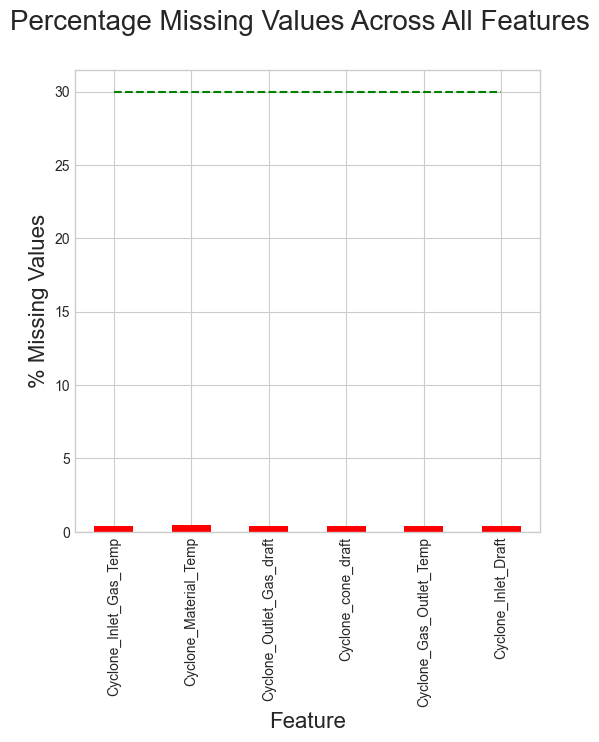

In [7]:
plot_missing_percentage(df)

In [8]:
def interpolate_columns(df, columns_to_interpolate):
    """
    Perform linear interpolation on selected columns in the DataFrame.

    Parameters:
    - df (pd.DataFrame): The DataFrame containing the data.
    - columns_to_interpolate (list): List of columns to interpolate.

    Returns:
    - pd.DataFrame: The DataFrame with interpolated values.
    """
    df[columns_to_interpolate] = df[columns_to_interpolate].interpolate(method='linear')
    return df

In [9]:
def calculate_missing_percentage(df):
    """
    Calculate the percentage of missing values for each column in the DataFrame.

    Parameters:
    - df (pd.DataFrame): The DataFrame containing the data.

    Returns:
    - pd.Series: A Series representing the percentage of missing values for each column.
    """
    missing_percentage = (df.isna().sum() / df.shape[0]) * 100
    return missing_percentage

In [10]:
# Specify columns to interpolate
columns_to_interpolate = df.columns[df.columns != 'time']

# Linear interpolation for selected columns
df = interpolate_columns(df.copy(), columns_to_interpolate)

# Calculate the percentage of missing values after interpolation
missing_percentage = calculate_missing_percentage(df)
missing_percentage

Cyclone_Inlet_Gas_Temp      0.0
Cyclone_Material_Temp       0.0
Cyclone_Outlet_Gas_draft    0.0
Cyclone_cone_draft          0.0
Cyclone_Gas_Outlet_Temp     0.0
Cyclone_Inlet_Draft         0.0
dtype: float64

In [11]:
def data_preparation(df, sampling_period='5min', time_period='30min', scaler_type='standard'):
    """
    Prepare data for anomaly detection using specified parameters for all features.

    Parameters:
    - df (pd.DataFrame): The DataFrame containing the data.
    - sampling_period (str): The sampling period in the dataset (default is '5min').
    - time_period (str): The time period for each sample (default is '30min').
    - scaler_type (str): The type of scaler for transformation ('identity' or 'standard', default is 'standard').

    Returns:
    - pd.DataFrame: The prepared DataFrame for anomaly detection with all features.
    """

    # Convert time strings to seconds
    sampling_period_seconds = int(pd.Timedelta(sampling_period).total_seconds())
    time_period_seconds = int(pd.Timedelta(time_period).total_seconds())

    # Initialize scaler
    scaler = {'identity': FunctionTransformer(lambda x: x), 'standard': StandardScaler()}
    df_transformed = pd.DataFrame(scaler[scaler_type].fit_transform(df))

    # Set columns and index
    df_transformed.columns = df.columns.copy()
    df_transformed.index = df.index.copy()

    # Reshape the data into samples for all features
    ncols_reshape = int(time_period_seconds / sampling_period_seconds)
    nrows_reshape = df_transformed.shape[0] // ncols_reshape
    X = np.concatenate([np.array(df_transformed[feature])[0:nrows_reshape * ncols_reshape].reshape(nrows_reshape, ncols_reshape) for feature in df_transformed.columns.values], axis=1)
    df_samples = pd.DataFrame(X)

    # Set the index of the samples
    df_samples.index = pd.date_range(df_transformed.index.min(),
                                     df_transformed.index.max() + pd.DateOffset(days=1),
                                     normalize=True,
                                     freq=str(time_period_seconds) + 'S')[0:df_samples.shape[0]]

    return df_samples

In [12]:
df_samples = data_preparation(df)
df_samples.head()

,0,1,2,3,4,5,6,7,8,9,...,26,27,28,29,30,31,32,33,34,35
2017-01-01 00:00:00,0.429433,0.464612,0.453816,0.452633,0.502307,0.462519,0.457338,0.479265,0.496420,0.493495,...,0.464489,0.463846,0.495128,0.477510,-0.062775,-0.112398,-0.051333,-0.023179,-0.030507,-0.075887
2017-01-01 00:30:00,0.545613,0.460366,0.439684,0.544157,0.452117,0.531238,0.573506,0.540303,0.537747,0.538684,...,0.480697,0.480697,0.502940,0.508762,-0.139009,-0.111626,-0.059175,-0.101085,-0.040920,-0.010580
2017-01-01 01:00:00,0.450298,0.474316,0.436924,0.522959,0.408417,0.499820,0.506731,0.536156,0.499687,0.553567,...,0.459005,0.510539,0.448281,0.490103,-0.109955,-0.031149,-0.072802,0.006004,0.021688,-0.117540
2017-01-01 01:30:00,0.412936,0.440836,0.502550,0.430555,0.428827,0.433861,0.491450,0.482077,0.520790,0.491052,...,0.496966,0.471505,0.464489,0.460598,-0.037449,-0.065603,-0.039763,-0.038092,-0.023436,0.008832
2017-01-01 02:00:00,0.468827,0.495363,0.438895,0.441139,0.447265,0.455574,0.518149,0.541553,0.536810,0.514258,...,0.498559,0.488908,0.495587,0.484128,0.062955,0.028758,-0.078330,-0.002481,-0.052490,-0.056475


## Dimensionality Reduction

### PCA

In [14]:
## Apply the dimension reduction function row by row to the timestamp matrix
## Note that the following is computationally slow
pca = PCA()
k = 0
#np.apply_along_axis(dimredux, 1, X, pca, k)

In [15]:
def pca_func(X, k):
    """
    Apply Principal Component Analysis (PCA) to the k-th row of the input array.

    Parameters:
    - X (numpy.ndarray): The input for PCA.
    - k (int): The index of the row to apply PCA.
    - explained_variance_threshold (float): The threshold for cumulative explained variance.

    Returns:
    - numpy.ndarray: PCA components of the selected row.
    """
    pca.fit(np.reshape(X[k, :], (int(X.shape[1] / len(df.columns)), len(df.columns))).T)
    cumulative_variance = np.cumsum(pca.explained_variance_)
    n_pca_components = (np.where(cumulative_variance / cumulative_variance[-1] >= 0.8)[0][0])
    return pca.components_[:, :n_pca_components+1]

In [16]:
df_new = pd.concat([df.iloc[:17517, :],df.iloc[17539:42268,:],df.iloc[42275:, :]])

In [17]:
df_samples = np.array(df_samples)
len(df_samples[:,0])
df_samples[0]

array([ 0.42943325,  0.4646117 ,  0.45381555,  0.45263283,  0.50230723,
        0.46251919,  0.45733781,  0.47926499,  0.49642045,  0.49349493,
        0.52505075,  0.51971098, -0.12163487, -0.06921178, -0.0383214 ,
       -0.01709055, -0.00873908, -0.10986231, -0.24128874, -0.19766119,
       -0.02459046, -0.1171606 , -0.10486959, -0.1520405 ,  0.42180981,
        0.45367378,  0.46448915,  0.46384574,  0.49512758,  0.47751048,
       -0.06277455, -0.11239771, -0.05133294, -0.02317886, -0.03050664,
       -0.0758874 ])

In [18]:
df_new.shape

(377690, 6)

### Calculating angle between subspace

In [19]:
df_samples.shape

(62953, 36)

In [20]:
subspaces = []
for i in range(17517):
    subspaces.extend([pca_func(df_samples,i)])
for i in range(17539,42268):
    subspaces.extend([pca_func(df_samples,i)])
for i in range(42275, 62953):
    subspaces.extend([pca_func(df_samples,i)])

In [21]:
subspaces

[array([[-0.14273456, -0.18679845],
        [-0.46071122, -0.22749638],
        [ 0.3554922 ,  0.45989717],
        [ 0.04095738, -0.38627956],
        [-0.79779466,  0.39210582],
        [ 0.05332434,  0.63157538]]),
 array([[-0.1979902 , -0.03960368],
        [-0.92029554, -0.15421578],
        [-0.26774163,  0.18343681],
        [ 0.19040748, -0.4602864 ],
        [-0.05406867, -0.47633831],
        [ 0.05469909, -0.70868768]]),
 array([[-0.03725625,  0.06060878],
        [ 0.76312461,  0.41502158],
        [-0.0820869 , -0.08302113],
        [ 0.4796141 , -0.54785318],
        [-0.40367912,  0.34574001],
        [ 0.12856135,  0.63048544]]),
 array([[-0.32296407, -0.17992164],
        [ 0.77087002,  0.28298464],
        [-0.17458325,  0.03803516],
        [-0.24130881,  0.73618631],
        [-0.45997392,  0.15794982],
        [ 0.03418148, -0.56496265]]),
 array([[ 0.05932701, -0.10039886],
        [ 0.36285682,  0.12842636],
        [-0.3146537 , -0.18430838],
        [ 0.70242024

In [22]:
def angle_btw_subspaces(subspaces, vals):
    A = subspaces[vals+1]
    B = subspaces[vals+2]
    temp1 = np.matmul(B.T, A)
    temp2 = np.matmul(temp1, A.T)
    temp3 = np.matmul(temp2, B)
    delta_val = np.sqrt(1 - min(np.linalg.eig(temp3)[0]))
    return delta_val

In [23]:
delta_vals = []
for i in range(len(subspaces)-1):
    delta_vals.append(angle_btw_subspaces(subspaces, i-1))
len(delta_vals)

62923

In [24]:
df.columns

Index(['Cyclone_Inlet_Gas_Temp', 'Cyclone_Material_Temp',
       'Cyclone_Outlet_Gas_draft', 'Cyclone_cone_draft',
       'Cyclone_Gas_Outlet_Temp', 'Cyclone_Inlet_Draft'],
      dtype='object')

In [25]:
from matplotlib.legend import Shadow
# User-defined function for producing a component plot of a vector
def plotveccomp(x, name = ' ', axis = None, linewidth = 1, color = 'black', marker = ''):
  ax = axis
  component_index = range(len(df_samples))
  ax.plot(component_index, x, linewidth = linewidth, color = color, marker = marker)
  ax.plot(component_index, [np.mean(x)]*len(x), linewidth = 1, linestyle = 'dashed', color ='blue',label='Mean')
  ax.plot(component_index, [np.mean(x) - np.std(x)]*len(x), linewidth = 1, linestyle = 'dashed', color ='red',label='Z-Score')
  ax.plot(component_index, [np.mean(x) + np.std(x)]*len(x), linewidth = 1, linestyle = 'dashed', color ='red')
  ax.plot(component_index, [np.mean(x) - 3*np.std(x)]*len(x), linewidth = 1, linestyle = 'dashed', color ='green',label='3 Std Deviations')
  plt.legend(framealpha=1, frameon=True,bbox_to_anchor=(1.0, 1.0))
  ax.set_xlabel('Timestamps (5min)')
  ax.set_ylabel('Feature')
  ax1.set_title('Cyclone_Inlet_Gas_Temp')
  ax2.set_title('Cyclone_Material_Temp')
  ax3.set_title('Cyclone_Outlet_Gas_draft')
  ax4.set_title('Cyclone_cone_draft')
  ax5.set_title('Cyclone_Gas_Outlet_Temp')
  ax6.set_title('Cyclone_Inlet_Draft')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


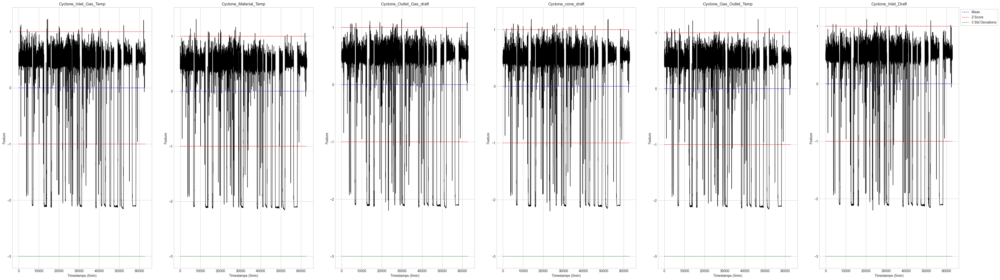

In [26]:
fig, (ax1, ax2, ax3, ax4, ax5, ax6) = plt.subplots(1, 6, figsize = (40,12))#24,5
fig.tight_layout(pad = 4.0)
plotveccomp(df_samples[:,0], 'Cyclone_Inlet_Gas_Temp', ax1)
plotveccomp(df_samples[:,1], 'Cyclone_Material_Temp', ax2)
plotveccomp(df_samples[:,2], 'Cyclone_Outlet_Gas_draft', ax3)
plotveccomp(df_samples[:,3], 'Cyclone_cone_draft', ax4)
plotveccomp(df_samples[:,4], 'Cyclone_Gas_Outlet_Temp', ax5)
plotveccomp(df_samples[:,5], 'Cyclone_Inlet_Draft', ax6)
plt.savefig('features.png')

In [27]:
from matplotlib.legend import Shadow
# User-defined function for producing a component plot of a vector
def plotveccomp(x, name = ' ', axis = None, linewidth = 1, color = 'black', marker = ''):
  ax = axis
  component_index = range(len(delta_vals))
  ax.plot(component_index, x, linewidth = linewidth, color = color, marker = marker)
  ax.plot(component_index, [np.mean(x)]*len(x), linewidth = 1, linestyle = 'dashed', color ='blue',label='Mean')
  ax.plot(component_index, [np.mean(x) - np.std(x)]*len(x), linewidth = 1, linestyle = 'dashed', color ='red',label='Z-Score')
  ax.plot(component_index, [np.mean(x) + np.std(x)]*len(x), linewidth = 1, linestyle = 'dashed', color ='red')
  ax.plot(component_index, [np.mean(x) - 4*np.std(x)]*len(x), linewidth = 2, linestyle = 'dashed', color ='green',label='3 Std Deviations')
  plt.legend(framealpha=1, frameon=True,bbox_to_anchor=(1.0, 1.0))
  ax.set_xlabel('Time in minutes')
  ax.set_ylabel('Delta')
  ax1.set_title('Angle between Subspaces')

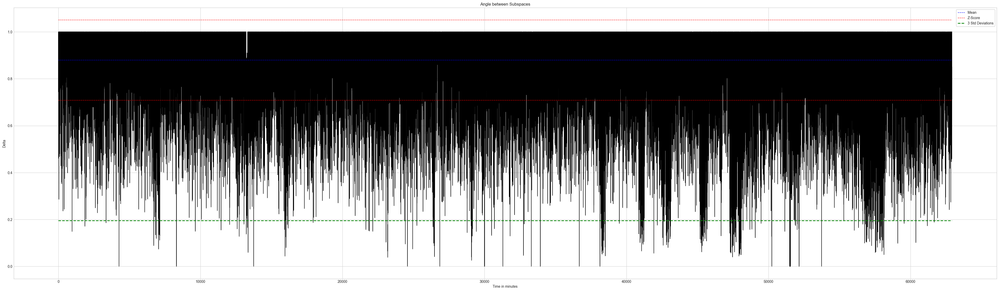

In [28]:
fig, (ax1) = plt.subplots(figsize = (40,12))#24,5
fig.tight_layout(pad = 4.0)
plotveccomp(delta_vals, 'Angle between subspaces', ax1)
plt.savefig('angle_btw_subspaces.png')

In [31]:
def anomaly(X, delta_vals):
    delta_vals = np.array(delta_vals)
    stdd_four = 4*np.std(delta_vals)
    anomalies = X[np.where((delta_vals - stdd_four) <= 0.0)]
    anomalies_index = np.where((delta_vals - stdd_four) <= 0.0)
    print(anomalies_index)
    print(len(anomalies_index[0]))
    anomaly_entries = []
    for i in range(len(anomalies_index[0])):
        anom = df_samples[anomalies_index[0][i]]
        anomaly_entries.append(anom)
    anomaly_entries = np.array(anomaly_entries)
    anomaly_entries = anomaly_entries.reshape(anomaly_entries[:,0].shape[0], anomaly_entries[0,:].shape[0]//len(df.columns), len(df.columns))
    print(anomaly_entries[:,0][:,0].shape)
    return anomalies_index, anomaly_entries

In [32]:
anomalies_index, anomaly_entries = anomaly(df_samples, delta_vals)

(array([   10,    38,    40, ..., 62910, 62916, 62918], dtype=int64),)
8071
(8071,)


In [33]:
def plotveccomp(x, name = ' ', axis = None, linewidth = 1, color = 'black', marker = ''):
  ax = axis
  component_index = range(len(anomalies_index[0]))
  ax.plot(component_index, x, linewidth = linewidth, color = color, marker = marker)
  ax.plot(component_index, [np.mean(x)]*len(x), linewidth = 1, linestyle = 'dashed', color ='blue',label='Mean')
  ax.plot(component_index, [np.mean(x) - np.std(x)]*len(x), linewidth = 1, linestyle = 'dashed', color ='red',label='Z-Score')
  ax.plot(component_index, [np.mean(x) + np.std(x)]*len(x), linewidth = 1, linestyle = 'dashed', color ='red')
  plt.legend(framealpha=1, frameon=True,bbox_to_anchor=(1.0, 1.0))
  ax.set_xlabel('Time in mins')
  ax.set_ylabel('Feature')
  ax1.set_title('Cyclone_Inlet_Gas_Temp')
  ax2.set_title('Cyclone_Material_Temp')
  ax3.set_title('Cyclone_Outlet_Gas_draft')
  ax4.set_title('Cyclone_cone_draft')
  ax5.set_title('Cyclone_Gas_Outlet_Temp')
  ax6.set_title('Cyclone_Inlet_Draft')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


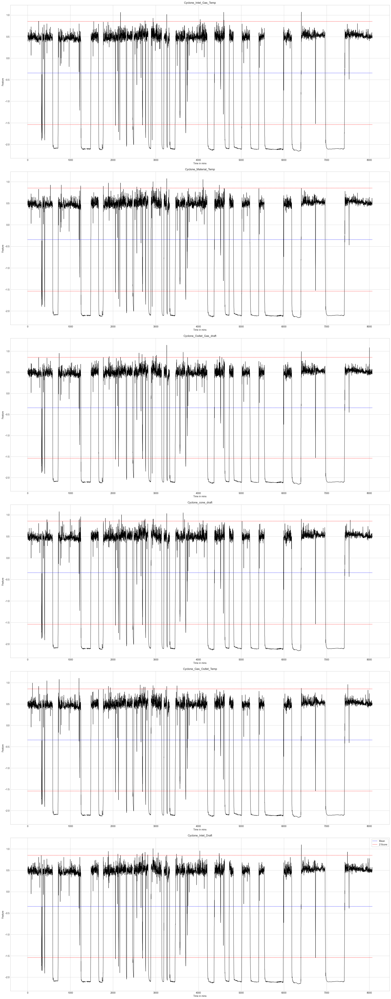

In [34]:
fig, (ax1, ax2, ax3, ax4, ax5, ax6) = plt.subplots(6, 1, figsize = (24,60))#24,5
fig.tight_layout(pad = 4.0)
plotveccomp(anomaly_entries[:,0][:,0], 'Cyclone_Inlet_Gas_Temp', ax1)
plotveccomp(anomaly_entries[:,0][:,1], 'Cyclone_Material_Temp', ax2)
plotveccomp(anomaly_entries[:,0][:,2], 'Cyclone_Outlet_Gas_draft', ax3)
plotveccomp(anomaly_entries[:,0][:,3], 'Cyclone_cone_draft', ax4)
plotveccomp(anomaly_entries[:,0][:,4], 'Cyclone_Gas_Outlet_Temp', ax5)
plotveccomp(anomaly_entries[:,0][:,5], 'Cyclone_Inlet_Draft', ax6)
plt.savefig('anomaly_plots.png')

In [35]:
def non_anomaly(X, delta_vals):
    delta_vals = np.array(delta_vals)
    stdd_four = 4*np.std(delta_vals)
    not_anomalies = X[np.where((delta_vals - stdd_four) > 0.0)]
    not_anomalies_index = np.where((delta_vals - stdd_four) > 0.0)
    print(not_anomalies_index)
    print(len(not_anomalies_index[0]))
    not_anomaly_entries = []
    for i in range(len(not_anomalies_index[0])):
        anom = df_samples[not_anomalies_index[0][i]]
        not_anomaly_entries.append(anom)
    not_anomaly_entries = np.array(not_anomaly_entries)
    not_anomaly_entries = not_anomaly_entries.reshape(not_anomaly_entries[:,0].shape[0], not_anomaly_entries[0,:].shape[0]//len(df.columns), len(df.columns))
    not_anomaly_entries[:,0][:,0].shape
    return not_anomalies_index, not_anomaly_entries

In [36]:
not_anomalies_index, not_anomaly_entries = non_anomaly(df_samples, delta_vals)

(array([    0,     1,     2, ..., 62920, 62921, 62922], dtype=int64),)
54852


In [37]:
def plotveccomp(x, name = ' ', axis = None, linewidth = 1, color = 'black', marker = ''):
  ax = axis
  component_index = range(len(not_anomalies_index[0]))
  ax.plot(component_index, x, linewidth = linewidth, color = color, marker = marker)
  ax.plot(component_index, [np.mean(x)]*len(x), linewidth = 1, linestyle = 'dashed', color ='blue',label='Mean')
  ax.plot(component_index, [np.mean(x) - np.std(x)]*len(x), linewidth = 1, linestyle = 'dashed', color ='red',label='Z-Score')
  ax.plot(component_index, [np.mean(x) - 2*np.std(x)]*len(x), linewidth = 2, linestyle = 'dashed', color ='green',label='2 SDs')
  ax.plot(component_index, [np.mean(x) + np.std(x)]*len(x), linewidth = 1, linestyle = 'dashed', color ='red')
  plt.legend(framealpha=1, frameon=True,bbox_to_anchor=(1.0, 1.0))
  ax.set_xlabel('Time in mins')
  ax.set_ylabel('Feature')
  ax1.set_title('Cyclone_Inlet_Gas_Temp')
  ax2.set_title('Cyclone_Material_Temp')
  ax3.set_title('Cyclone_Outlet_Gas_draft')
  ax4.set_title('Cyclone_cone_draft')
  ax5.set_title('Cyclone_Gas_Outlet_Temp')
  ax6.set_title('Cyclone_Inlet_Draft')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


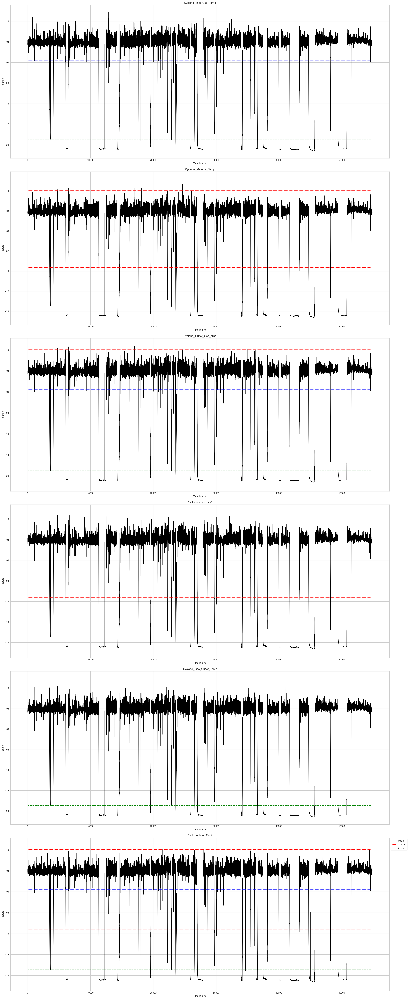

In [38]:
fig, (ax1, ax2, ax3, ax4, ax5, ax6) = plt.subplots(6, 1, figsize = (24,60))#24,5
fig.tight_layout(pad = 4.0)
plotveccomp(not_anomaly_entries[:,0][:,0], 'Cyclone_Inlet_Gas_Temp', ax1)
plotveccomp(not_anomaly_entries[:,0][:,1], 'Cyclone_Material_Temp', ax2)
plotveccomp(not_anomaly_entries[:,0][:,2], 'Cyclone_Outlet_Gas_draft', ax3)
plotveccomp(not_anomaly_entries[:,0][:,3], 'Cyclone_cone_draft', ax4)
plotveccomp(not_anomaly_entries[:,0][:,4], 'Cyclone_Gas_Outlet_Temp', ax5)
plotveccomp(not_anomaly_entries[:,0][:,5], 'Cyclone_Inlet_Draft', ax6)
plt.savefig('non_anomaly_plots.png')

In [78]:
import plotly.graph_objects as go

f1 = go.FigureWidget()
f2 = go.FigureWidget()
f3 = go.FigureWidget()
f4 = go.FigureWidget()
f5 = go.FigureWidget()
f6 = go.FigureWidget()
def anomaly_plots(anomaly_entries, f1, f2, f3, f4, f5, f6):
    
    f1.add_scatter(y=anomaly_entries[:,0][:,0])
    f1.layout.title = 'Cyclone Inlet Gas Temperature'
    
    f2.add_scatter(y=anomaly_entries[:,0][:,1])
    f2.layout.title = 'Cyclone Material Temperature'
    
    f3.add_scatter(y=anomaly_entries[:,0][:,2])
    f3.layout.title = 'Cyclone Outlet Gas Draft'
    
    f4.add_scatter(y=anomaly_entries[:,0][:,3])
    f4.layout.title = 'Cyclone Cone Draft'
    
    f5.add_scatter(y=anomaly_entries[:,0][:,4])
    f5.layout.title = 'Cyclone Gas Outlet Temperature'
    
    f6.add_scatter(y=anomaly_entries[:,0][:,5])
    f6.layout.title = 'Cyclone Inlet Draft'
    return f1, f2, f3, f4, f5, f6
f1, f2, f3, f4, f5, f6 = anomaly_plots(anomaly_entries, f1, f2, f3, f4, f5, f6)
f1.show()
f2.show()
f3.show()
f4.show()
f5.show()
f6.show()

In [87]:
import plotly.graph_objects as go

f1 = go.FigureWidget()
f2 = go.FigureWidget()
f3 = go.FigureWidget()
f4 = go.FigureWidget()
f5 = go.FigureWidget()
f6 = go.FigureWidget()
def non_anomaly_plots(not_anomaly_entries, f1, f2, f3, f4, f5, f6):
    
    f1.add_scatter(y=not_anomaly_entries[:,0][:,0])
    f1.layout.title = 'Cyclone Inlet Gas Temperature'
    
    f2.add_scatter(y=not_anomaly_entries[:,0][:,1])
    f2.layout.title = 'Cyclone Material Temperature'
    
    f3.add_scatter(y=not_anomaly_entries[:,0][:,2])
    f3.layout.title = 'Cyclone Outlet Gas Draft'
    
    f4.add_scatter(y=not_anomaly_entries[:,0][:,3])
    f4.layout.title = 'Cyclone Cone Draft'
    
    f5.add_scatter(y=not_anomaly_entries[:,0][:,4])
    f5.layout.title = 'Cyclone Gas Outlet Temperature'
    
    f6.add_scatter(y=not_anomaly_entries[:,0][:,5])
    f6.layout.title = 'Cyclone Inlet Draft'
    return f1, f2, f3, f4, f5, f6
f1, f2, f3, f4, f5, f6 = non_anomaly_plots(not_anomaly_entries, f1, f2, f3, f4, f5, f6)
f1.show()
f2.show()
f3.show()
f4.show()
f5.show()
f6.show()